In [35]:
#!pip install numpy
#!pip install pandas
#!pip install plotly
#!pip install chemotools
#!pip install scipy
#!pip install scikit-learn
#!pip install Tensorflow
#!pip install Keras

## **Oscilador Harmônico Amortecido e STFT**

Vamos utilizar a equação de um sistema de oscilador harmônico simples amortecido para gerar um sinal períodico, e depois vamos utilizar a short-time fast fourier transform para extrair as frequencias de base e estudar como elas diminuem de intensidade ao longo do tempo. 
<br>A equação de movimento é: <br>
## $x(t)=Ae^{-at}cos(2πf_0t+ψ)$ <br>
- **$A$** = amplitude inicial<br>
- **$a$** = coeficiente de amortecimento<br>
- **$f_0$** = frequência do oscilador (Hz)
- **$ψ$** = fase inicial (rad)

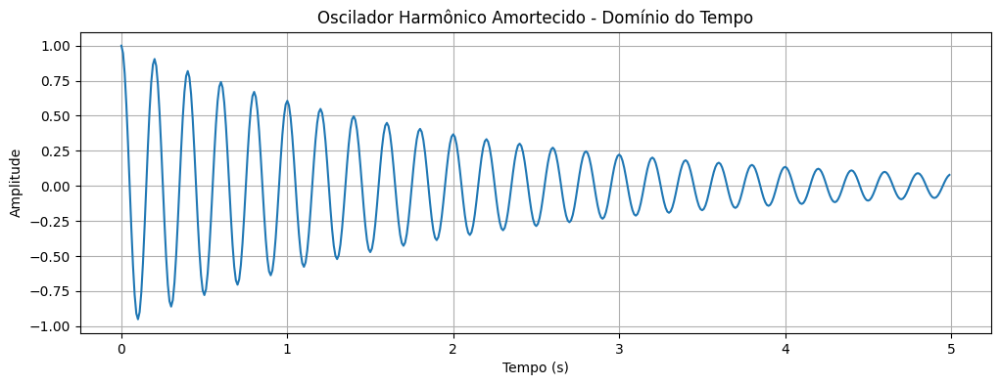

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft

# Definição dos parâmetros do oscilador harmônico amortecido

A = 1.0             # Amplitude inicial
alpha = 0.5         # Taxa de decaimento (amortecimento)
f0 = 5.0            # Frequência do oscilador em Hz
phi = 0.0           # Fase inicial em radianos

# Parâmetros de amostragem

# Para a frequencia de amostragem, temos a recomendação de que seja pelo menos o dobro da frequência do sinal (Teorema de Nyquist).
# Logo, se f0 = 5 Hz, a frequência de amostragem deve ser pelo menos 10 Hz. Mas para garantir uma boa resolução, vamos usar 100 Hz.
fs = 100.0          # Frequência de amostragem em Hz. Ou seja, 100 amostras por unidade de tempo (t)

# O período de observação T deve ser suficientemente longo para capturar várias oscilações do sinal.
# Vamos escolher T = 5 segundos, o que nos dará uma boa visualização do comportamento do oscilador.
T = 5.0             # Duração do sinal em segundos (período total de observação)

# Geração do vetor de tempo
# O vetor de tempo t será criado com fs*T pontos, onde fs é a frequência de amostragem e T é o período de observação.
t = np.linspace(0, T, int(fs*T), endpoint=False)  # Eixo de tempo
# o endpoint=False garante que o último ponto não seja incluído,
# o np.linspace cria um vetor de tempo que vai de 0 a T
# O vetor t terá fs*T pontos, ou seja, 500 pontos para T=5s e fs=100Hz.

# Geração do sinal amortecido
x = A * np.exp(-alpha * t) * np.cos(2 * np.pi * f0 * t + phi)

# Plot no domínio do tempo
plt.figure(figsize=(12, 4))
plt.plot(t, x)
plt.title("Oscilador Harmônico Amortecido - Domínio do Tempo")
plt.xlabel("Tempo (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

# Aqui vemos o comportamento do oscilador: ele vibra a f0 = 5 Hz,
# mas sua amplitude decai exponencialmente com coeficiente alpha.

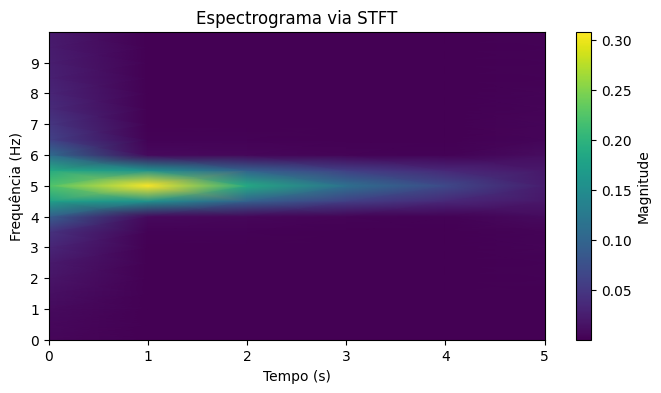

In [37]:
# Cálculo da Short-Time Fourier Transform (STFT)

#    Usamos 50% de overlap
f, t_seg, Zxx = stft(x, fs=fs, nperseg=200, noverlap=100)

# 5. Plot do espectrograma
plt.figure(figsize=(8, 4))
plt.pcolormesh(t_seg, f, np.abs(Zxx), shading='gouraud')
plt.title("Espectrograma via STFT")
plt.ylabel("Frequência (Hz)")
plt.xlabel("Tempo (s)")
plt.ylim(0, fs/10) 
plt.xticks(np.arange(0, T+1, 1))  # Marcas no eixo x a cada segundo     
plt.yticks(np.arange(0, 10, 1))  # Marcas no eixo x a cada segundo     
plt.xlim(0.0, 5.0)      
plt.colorbar(label='Magnitude')
plt.show()

# No espectrograma, observamos um pico em torno de f0 = 5 Hz,
# cuja magnitude diminui ao longo do tempo devido ao amortecimento.

# **Sinal composto - 3 osciladores**

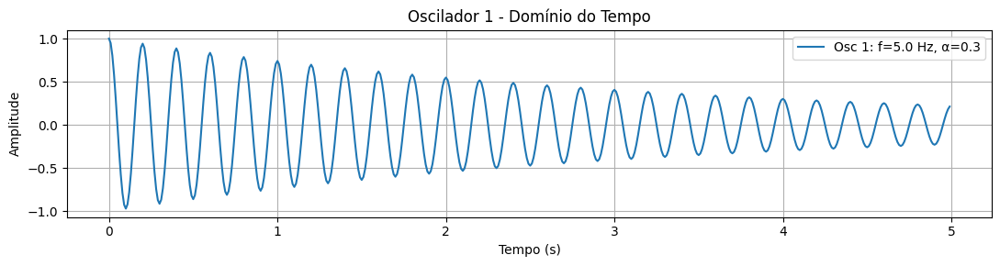

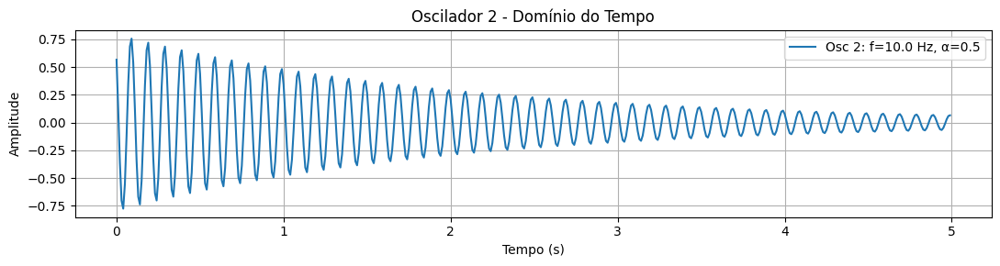

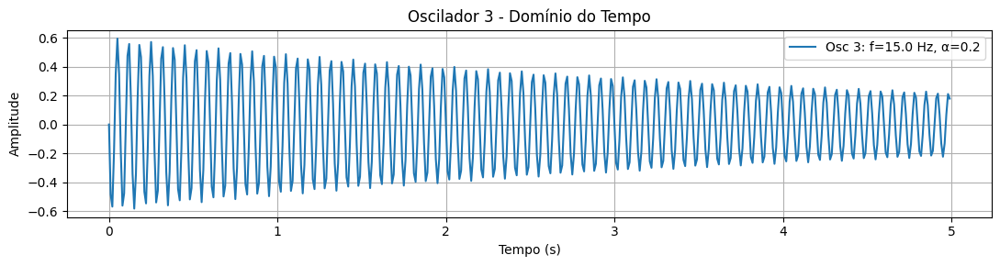

In [38]:

# Parâmetros dos 3 osciladores amortecidos
params = [
    {'A': 1.0, 'alpha': 0.3, 'f': 5.0,  'phi': 0.0},       # Oscilador 1
    {'A': 0.8, 'alpha': 0.5, 'f': 10.0, 'phi': np.pi/4},   # Oscilador 2
    {'A': 0.6, 'alpha': 0.2, 'f': 15.0, 'phi': np.pi/2}    # Oscilador 3
]

# Parâmetros de amostragem
fs = 100.0          # Frequência de amostragem (Hz)
T = 5.0             # Duração do sinal (s)
t = np.linspace(0, T, int(fs*T), endpoint=False)  # Eixo de tempo

# Geração dos sinais individuais
components = []
for idx, p in enumerate(params, start=1):
    xi = p['A'] * np.exp(-p['alpha'] * t) * np.cos(2 * np.pi * p['f'] * t + p['phi'])
    components.append(xi)
    # Plot individual
    plt.figure(figsize=(11, 3))
    plt.plot(t, xi, label=f"Osc {idx}: f={p['f']} Hz, α={p['alpha']}")
    plt.title(f"Oscilador {idx} - Domínio do Tempo")
    plt.xlabel("Tempo (s)")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


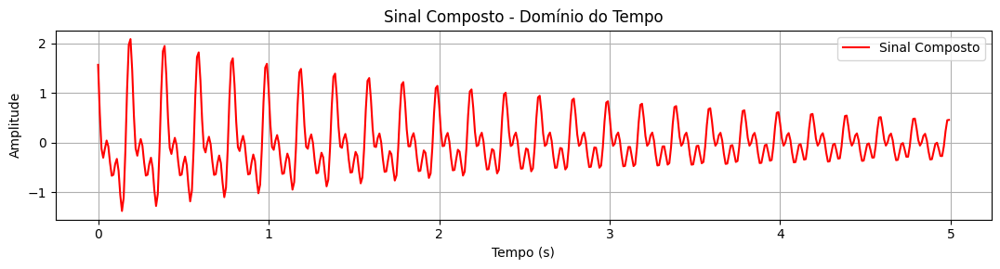

In [39]:
# Sinal composto: soma das componentes
x_composite = sum(components)

plt.figure(figsize=(11, 3))
plt.plot(t, x_composite, color='red', label='Sinal Composto')
plt.title("Sinal Composto - Domínio do Tempo")
plt.xlabel("Tempo (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

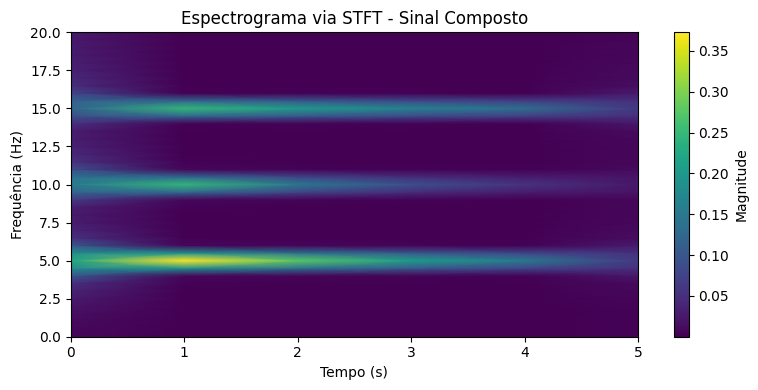

In [40]:
# STFT e espectrograma
f, t_seg, Zxx = stft(x_composite, fs=fs, nperseg=200, noverlap=100)

plt.figure(figsize=(8, 4))
plt.pcolormesh(t_seg, f, np.abs(Zxx), shading='gouraud')
plt.title("Espectrograma via STFT - Sinal Composto")
plt.ylabel("Frequência (Hz)")
plt.xlabel("Tempo (s)")
plt.ylim(0, fs/5)
plt.colorbar(label='Magnitude')
plt.tight_layout()
plt.show()

In [41]:
def resumo(Ref_cal, Pred_cal, Ref_val, Pred_val):
    """
    Função para calcular as métricas de desempenho do modelo de regressão linear.
    Args:
        Ref_cal (array): Valores reais de calibração.
        Pred_cal (array): Valores previstos de calibração.
        Ref_val (array): Valores reais de validação.
        Pred_val (array): Valores previstos de validação.
    Returns:
        pd.DataFrame: DataFrame com as métricas de desempenho.
    """
    import pandas as pd
    import numpy as np
    from sklearn.metrics import mean_squared_error, r2_score
    from scipy.stats import iqr


    # Calculando R²
    R2_cal = r2_score(Ref_cal, Pred_cal)
    R2_val = r2_score(Ref_val, Pred_val)

    # Calculando RMMSE
    rmsec = np.sqrt(mean_squared_error(Ref_cal, Pred_cal))
    rmsep = np.sqrt(mean_squared_error(Ref_val, Pred_val))

    #Calculando rpd
    rpd = np.std(Ref_cal)/rmsep

    #Calculando RPIQ
    rpiq = iqr(Ref_val, rng=(25,75))/rmsep

    # Calculando Bias
    bias_pred = sum(Ref_val - Pred_val) / len(Pred_val)

    # Resumo do modelo
    resumo = pd.DataFrame([R2_cal, R2_val, rmsec, rmsep, rpd, rpiq, bias_pred]).T
    resumo.columns = ['R2_cal', 'R2_pred', 'RMSEC', 'RMSEP','RPD', 'RPIQ', 'Bias_pred']
    return resumo.round(3)

## **importando dados .csv com o pandas.read_csv**

In [42]:
import pandas as pd
Dataset = pd.read_csv('Dataset.csv', header=0, sep=';') #importando os dados
Atributos = Dataset.loc[:, ['SOC', 'CEC', 'pH', 'exMg', 'exP', 'exK', 'exCa']] #extraindo os atributos


## **kennard-stone**

In [43]:
# dividindo os dados via kennard-stone (mais recomendado)
import kennard_stone as ks

Ycal, Yval = ks.train_test_split(Atributos, test_size=0.25) # divide o dataframe Y em 70% para treino e 30% para teste

C:\Users\Usuario\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

2025-05-29 11:21:57,277 - kennard_stone.utils._pairwise:109[INFO] - Calculating pairwise distances using scikit-learn.

C:\Users\Usuario\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

2025-05-29 11:21:57,292 - kennard_stone.utils._pairwise:109[INFO] - Calculating pairwise distances using scikit-learn.

C:\Users\Usuario\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [44]:
# antes de começar, vamos utilizar os dados espectrais (com muitas variaveis) para fazer uma regressão PLS
pd.options.plotting.backend = 'plotly'

XRF = Dataset.loc[:,'1':'15'] 

# vamos utilizar a mesma separação de dados gerada no KS anterior para separar os espectros cal e val

XRFcal = XRF.loc[Ycal.index, :] # seleciona as linhas correspondentes as amostras de calibração
XRFval = XRF.loc[Yval.index, :] # seleciona os dados de validação

Ycal = Ycal.reset_index(drop=True) # reseta o índice do dataframe
Yval = Yval.reset_index(drop=True) # reseta o índice do dataframe 

In [45]:
# vamos pre-processar os dados com poisson scale + mean centering
import preprocessings as prepr
import numpy as np

#XRFcal_prep, meanXRF, meanpoisson = prepr.poisson(XRFcal, mc=True) # aplica o preprocessamento 
#XRFval_prep = (XRFval / np.sqrt(meanXRF)) - meanpoisson # aplica o mesmo preprocessamento nos dados de validação

XRFcal_prep, meanXRF = prepr.poisson(XRFcal, mc=False) # aplica o preprocessamento 
XRFval_prep = (XRFval / np.sqrt(meanXRF)) # - meanpoisson # aplica o mesmo preprocessamento nos dados de validação

In [46]:
XRFcal_prep.T.plot()

## **Espectrogramas via Short Time FFT**

In [47]:
from scipy.signal import stft

#sampling_freq = 0.1 # Frequência de amostragem
frame_size = 6 # Tamanho da janela
overlap_size = 3 # Sobreposição da janela
hop_size = frame_size - overlap_size # Tamanho do passo

# Gera o espectrograma
freq, vars, Zstft= stft(x=XRFcal_prep.loc[0,:], 
                  #fs=sampling_freq,
                  nperseg=frame_size,
                  noverlap=overlap_size,
                  window='hann',
                  boundary=None,
                  padded=False,
                  scaling='spectrum',
                  return_onesided=True)


In [48]:
#comparando as dimensões esperadas e as geradas
frequency_bins = frame_size // 2 + 1
frames_bins = ((XRFcal_prep.shape[1] - frame_size)// hop_size )+ 1
print(f'frequency_bins={frequency_bins} and frames_bins={frames_bins}')	

frequency_bins=4 and frames_bins=232


In [49]:
Zstft.shape # verifica o tamanho dos coeficientes da STFT

(4, 232)

In [50]:
Zstft.view() # visualizando os coeficientes complexos da STFT

array([[ 3.83295465e-01+0.00000000e+00j,  3.89033511e-01+0.00000000e+00j,
         3.72852089e-01+0.00000000e+00j,  3.86176242e-01+0.00000000e+00j,
         3.31270610e-01+0.00000000e+00j,  3.99511888e-01+0.00000000e+00j,
         1.43142877e+00+0.00000000e+00j,  2.40525863e+00+0.00000000e+00j,
         1.61121084e+00+0.00000000e+00j,  7.85880710e-01+0.00000000e+00j,
         2.06850697e+00+0.00000000e+00j,  4.28672201e+00+0.00000000e+00j,
         3.45351597e+00+0.00000000e+00j,  1.44795554e+00+0.00000000e+00j,
         6.86782960e-01+0.00000000e+00j,  5.52716674e-01+0.00000000e+00j,
         6.72748349e-01+0.00000000e+00j,  5.62933225e-01+0.00000000e+00j,
         4.97780410e-01+0.00000000e+00j,  5.22855385e-01+0.00000000e+00j,
         7.43009166e-01+0.00000000e+00j,  8.88073517e-01+0.00000000e+00j,
         7.47100931e-01+0.00000000e+00j,  6.07948242e-01+0.00000000e+00j,
         7.04969460e-01+0.00000000e+00j,  1.00645635e+00+0.00000000e+00j,
         1.97849230e+00+0.00000000e+00

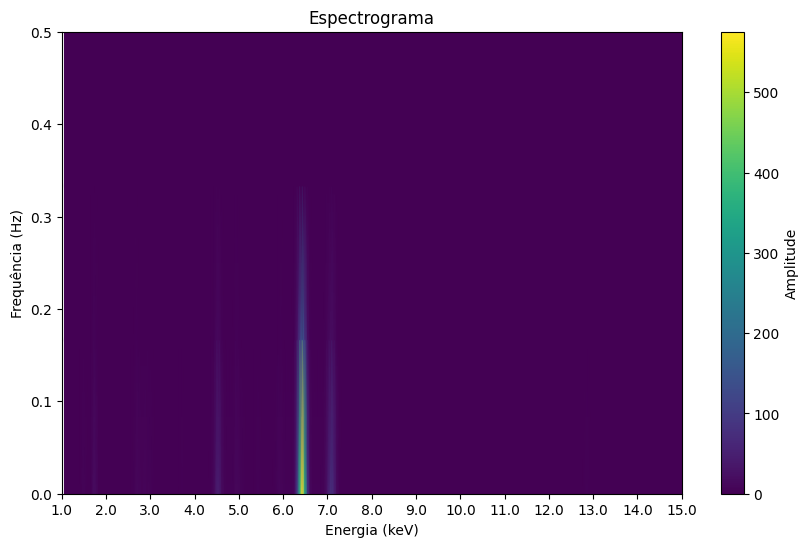

In [51]:
# Visualização do espectrograma
import matplotlib.pyplot as plt

# Ajusta o eixo x para a escala de energia (1.0 a 15.0)
energy_min = float(XRFval_prep.columns[0])
energy_max = float(XRFval_prep.columns[-1])
energy_range = energy_max - energy_min

# vars vai de 0 até XRFcal_prep.shape[1], queremos mapear para energia de 1.0 até 15.0
energy_vars = energy_min + (vars / vars.max()) * energy_range

plt.figure(figsize=(10, 6))
plt.pcolormesh(energy_vars, freq, np.abs(Zstft) ** 2, shading='gouraud')
plt.xlabel('Energia (keV)')
plt.ylabel('Frequência (Hz)')
plt.colorbar(label='Amplitude')
plt.title('Espectrograma')
xticks=np.arange(energy_min, energy_max+1, step=1.0)
plt.xticks(ticks=xticks, labels=np.round(xticks, 2))
plt.xlabel('Energia (keV)')
plt.show()

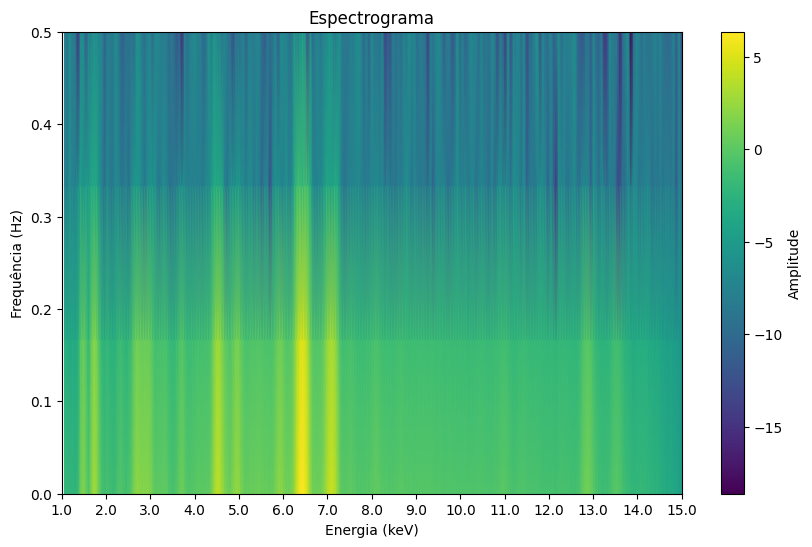

In [52]:
# Visualização do espectrograma
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.pcolormesh(energy_vars, freq, np.log(np.abs(Zstft) ** 2), shading='gouraud')
plt.xlabel('Energia (keV)')
plt.ylabel('Frequência (Hz)')
plt.colorbar(label='Amplitude')
plt.title('Espectrograma')
xticks=np.arange(energy_min, energy_max+1, step=1.0)
plt.xticks(ticks=xticks, labels=np.round(xticks, 2))
plt.xlabel('Energia (keV)')
plt.show()

In [53]:
#Calculando o espectrograma para todas as amostras de calibração

# Lista para armazenar os espectrogramas como arrays
espectrogramas_cal_list = []

for i in range(XRFcal_prep.shape[0]):    
    freq, vars, Zxx = stft(XRFcal_prep.iloc[i, :],
                                          #fs=sampling_freq, 
                                          nperseg=frame_size,
                                          noverlap=overlap_size,
                                          window='hann',
                                          boundary=None,
                                          padded=False,
                                          scaling='spectrum',
                                          return_onesided=True)

    # Transformação do espectrograma para a escala logarítmica
    espectrogramas_cal_abs = np.abs(Zxx) ** 2  # Calcula o espectrograma de potência
    espectrogramas_log_cal = np.log(espectrogramas_cal_abs+ 1e-20)  # Adiciona uma pequena constante para evitar log(0)
    
    # Adiciona o espectrograma à lista
    espectrogramas_cal_list.append(espectrogramas_log_cal)

# Converte a lista de espectrogramas em um único array NumPy 3D
espectrograma_cal = np.stack(espectrogramas_cal_list, axis=0)  # Empilha ao longo do primeiro eixo

# Verificar a forma do array
print(espectrograma_cal.shape)  # Deve retornar algo como (n_amostras, n_freqs, n_times)

(651, 4, 232)


In [54]:
#Calculando o espectrograma para todas as amostras de validação

# Lista para armazenar os espectrogramas como arrays
espectrogramas_val_list = []

for i in range(XRFval_prep.shape[0]):    
    freq, vars, Zxx = stft(XRFval_prep.iloc[i, :],
                                          #fs=sampling_freq, 
                                          nperseg=frame_size,
                                          noverlap=overlap_size,
                                          window='hann',
                                          boundary=None,
                                          padded=False,
                                          scaling='spectrum',
                                          return_onesided=True)

    # Transformação do espectrograma para a escala logarítmica
    espectrogramas_val_abs = np.abs(Zxx) ** 2  # Calcula o espectrograma de potência
    espectrogramas_log_val = np.log(espectrogramas_val_abs+ 1e-20)  # Adiciona uma pequena constante para evitar log(0)
    
    # Adiciona o espectrograma à lista
    espectrogramas_val_list.append(espectrogramas_log_val)

# Converte a lista de espectrogramas em um único array NumPy 3D
espectrograma_val = np.stack(espectrogramas_val_list, axis=0)  # Empilha ao longo do primeiro eixo

# Verificar a forma do array
print(espectrograma_val.shape)  # Deve retornar algo como (n_amostras, n_freqs, n_times)

(217, 4, 232)


In [55]:
#reprodutibilidade pelo TF
import os
import random
import tensorflow as tf

# Define um valor fixo para a semente
seed_value = 1

# 1. Configura a semente para o Python
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)

# 2. Configura a semente para o NumPy
np.random.seed(seed_value)

# 3. Configura a semente para o TensorFlow
tf.random.set_seed(seed_value)


## **Tensorflow (API Funcional)**

In [56]:
espectrograma_cal.shape[1:]  # Obtém a forma do espectrograma

(4, 232)

In [57]:
espectrograma_cal = espectrograma_cal[..., np.newaxis]  # agora shape é (n, altura, largura, 1=canal)
espectrograma_val = espectrograma_val[..., np.newaxis]
espectrograma_cal.shape, espectrograma_val.shape  # Verifica as novas formas

((651, 4, 232, 1), (217, 4, 232, 1))

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Input, LeakyReLU

# Definindo o modelo CNN
Input_size = (espectrograma_cal.shape[1], espectrograma_cal.shape[2], espectrograma_cal.shape[3])  # (altura, largura, canais)

Input_layer = Input(shape=Input_size, name='Input')
Conv1 = Conv2D(filters=64, kernel_size=(2,1), strides=(1,1), activation='linear', padding='same')(Input_layer)
LRelu1 = LeakyReLU(negative_slope=0.3)(Conv1)
MaxP1 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid')(LRelu1)
Flatt = Flatten()(MaxP1)
Dense1 = Dense(units=128, activation='linear')(Flatt)
LRelu3 = LeakyReLU(negative_slope=0.3)(Dense1)  # Aplicando Leaky ReLU
Dense2 = Dense(units=64, activation='linear')(LRelu3)
LRelu4 = LeakyReLU(negative_slope=0.3)(Dense2)  # Aplicando Leaky ReLU
Dense3 = Dense(units=32, activation='linear')(LRelu4)
LRelu5 = LeakyReLU(negative_slope=0.3)(Dense3)  # Aplicando Leaky ReLU
Output = Dense(units=1, activation='linear')(LRelu5)

CNN2D = Model(inputs=Input_layer, outputs=Output) 
CNN2D.summary()

**Alguns comentários sobre a PreLU e a regularização L2**

Por padrão, a camada PReLU aprende um parâmetro **α** distinto para cada elemento da entrada, excluindo a dimensão do lote (batch). Por exemplo, se a saída de uma camada anterior tiver a forma (batch_size, height, width, channels), a PReLU aprenderá um tensor **α** com a forma (height, width, channels). Isso significa que há um valor de **α** para cada posição espacial e canal, o que pode resultar em um grande número de parâmetros, especialmente para entradas de alta dimensão.<br>
A regularização é uma técnica fundamental em aprendizado de máquina para prevenir o overfitting, onde é adicionada uma penalidade ao valor absoluto dos parâmetros treinados que estão sendo avaliados (**α** no contexto da PReLU), ajudando a manter valores próximos do ideal, pois quando **α** gera erros grandes ele é penalizado. L1, L2, L3, etc. indicam que a penalização é de ordem 1, quadrática, cúbica, etc. A equação de base é: <br>

$ L_{total}(w, β, etc...) = L_{original}(w, β, etc...) + λ\sum_{i=1}^{n_α} (α_i)^2$ <br>

Portanto, no contexto do TensorFlow/Keras, regularizers.l2(0.01) usa **λ=0.01** e aplica uma penalização proporcional ao quadrado da magnitude dos coeficientes **α**. Isso significa que, durante o treinamento, o modelo é penalizado por ter pesos grandes, incentivando-o a manter pesos menores e, consequentemente, a ser mais simples e generalizável

In [26]:
# Melhor modelo atualmente

from tensorflow.keras import Model, regularizers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Input, PReLU
from tensorflow.keras.initializers import Constant

# Definindo o modelo CNN
Input_size = (espectrograma_cal.shape[1], espectrograma_cal.shape[2], espectrograma_cal.shape[3])  # (altura, largura, canais)

Input_layer = Input(shape=Input_size, name='Input')
Conv1 = Conv2D(filters=64, kernel_size=(2,1), strides=(1,1), activation='linear', padding='same')(Input_layer)
PRelu1 = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Conv1)  # Aplicando PReLU
MaxP1 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid')(PRelu1)
Flatt = Flatten()(MaxP1)
Dense1 = Dense(units=128, activation='linear')(Flatt)
PRelu3 = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense1)  # Aplicando Leaky ReLU
Dense2 = Dense(units=64, activation='linear')(PRelu3)
PRelu4 = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense2)  # Aplicando Leaky ReLU
Dense3 = Dense(units=32, activation='linear')(PRelu4)
PRelu5 = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense3)  # Aplicando Leaky ReLU
Output = Dense(units=1, activation='linear')(PRelu5)

CNN2D = Model(inputs=Input_layer, outputs=Output) 
CNN2D.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input (InputLayer)              │ (None, 4, 232, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 4, 232, 64)     │           192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ p_re_lu (PReLU)                 │ (None, 4, 232, 64)     │        59,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 2, 116, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 14848)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,900,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ p_re_lu_1 (PReLU)               │ (None, 128)            │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ p_re_lu_2 (PReLU)               │ (None, 64)             │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ p_re_lu_3 (PReLU)               │ (None, 32)             │            32 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,970,849 (7.52 MB)

 Trainable params: 1,970,849 (7.52 MB)

 Non-trainable params: 0 (0.00 B)

In [22]:
# compilando o modelo
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred))) # gerando a função de erro RMSE

# implementando o earlstopping para definir um criterio de parada
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(
    monitor='val_r2_score',    # prefixo "val_" para validação, caso contrario ele atua no treino (val_r2_score para o r2_score da validação por exemplo)
    mode='max',                # queremos minimizar o erro de validação
    patience=30,             # número de épocas sem melhoria antes de parar o treinamento
    restore_best_weights=True,
    verbose=1)                  # para ver quando o callback aciona

CNN2D.compile(optimizer='Adam', loss=rmse, metrics=['r2_score']) # compila o modelo, definindo o otimizador, a função de erro e as métricas que serão utilizadas para avaliar o desempenho do modelo

historico_CNN2D = CNN2D.fit(x=espectrograma_cal,
                       y=Ycal['exCa'],
                       epochs=30,
                       batch_size=10,  
                       validation_data=(espectrograma_val, Yval['exCa']), 
                       callbacks=[early_stopping],
                       verbose=1)

Epoch 1/30
66/66 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - loss: 57.0571 - r2_score: -77.8900 - val_loss: 35.1082 - val_r2_score: 0.1879
Epoch 2/30
66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 31.6465 - r2_score: -0.2790 - val_loss: 20.9804 - val_r2_score: 0.3814
Epoch 3/30
66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 18.3919 - r2_score: 0.4747 - val_loss: 11.9773 - val_r2_score: 0.5120
Epoch 4/30
66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 10.4704 - r2_score: 0.5223 - val_loss: 7.8053 - val_r2_score: -0.5547
Epoch 5/30
66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 6.1181 - r2_score: 0.3203 - val_loss: 3.9507 - val_r2_score: 0.4753
Epoch 6/30
66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 3.5895 - r2_score: 0.4072 - val_loss: 2.2461 - val_r2_score: 0.6845
Epoch 7/30
66/66 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 2.1627 - r2_score: 0.5997 - val_loss: 1.5130 - val_r2_score: 0.7229
Epoch 8/30
66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 1.5076 - r2_score: 0.6895 - val_loss: 1.4

Para utilizar o modelo em novos dados, novamente analogo ao sklearn, utilizamos o **model.predict**

In [23]:
# Resultados de calibração e predição por meio do comando predict()
calres_cnn2d = pd.DataFrame({'Ref': Ycal['exCa'], 'Pred': CNN2D.predict(espectrograma_cal).flatten()})

# resultados de validação
predres_cnn2d = pd.DataFrame({'Ref': Yval['exCa'], 'Pred': CNN2D.predict(espectrograma_val).flatten()})

# extraindo metricas de desempenho do modelo
resumo_cnn2d = resumo(calres_cnn2d['Ref'], calres_cnn2d['Pred'], predres_cnn2d['Ref'], predres_cnn2d['Pred']).T # calcula o resumo para os dados de calibração
resumo_cnn2d

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


,0
R2_cal,0.876
R2_pred,0.808
RMSEC,0.672
RMSEP,0.828
RPD,2.311
RPIQ,3.685
Bias_pred,-0.003


## **CNN2D - multi target**

In [73]:
#reprodutibilidade pelo TF
import os
import random
import tensorflow as tf

# Define um valor fixo para a semente
seed_value = 1

# 1. Configura a semente para o Python
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)

# 2. Configura a semente para o NumPy
np.random.seed(seed_value)

# 3. Configura a semente para o TensorFlow
tf.random.set_seed(seed_value)


In [85]:
# Melhor modelo atualmente

from tensorflow.keras import Model, regularizers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Input, PReLU, Dropout, Conv1D, MaxPooling1D
from tensorflow.keras.initializers import Constant

# Definindo o modelo CNN
Input_size = (espectrograma_cal.shape[1], espectrograma_cal.shape[2], espectrograma_cal.shape[3])  # (altura, largura, canais) = (4, 232, 1)

Camada_input = Input(shape=Input_size, name='Input_mt')
Conv1_comum = Conv2D(filters=128, kernel_size=(2,1), strides=(1,1), activation='linear', padding='same')(Camada_input) # "same" resulta em preenchimento uniforme à esquerda/direita ou para cima/baixo da entrada. Quando padding="same" e strides=1, a saída tem o mesmo tamanho que a entrada.
PRelu1_comum = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Conv1_comum)  # Aplicando PReLU
MaxP1_comum = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid')(PRelu1_comum) # "valid" indica que padding não será aplicado
Flatt_comum = Flatten()(MaxP1_comum)

# Camada exCa
Dense1exCa = Dense(units=128, activation='linear', name='Dense_exCa1')(Flatt_comum)
PRelu2exCa = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense1exCa)
Dense2exCa = Dense(units=64, activation='linear', name='Dense_exCa2')(PRelu2exCa)
PRelu3exCa = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense2exCa)
Dense3exCa = Dense(units=32, activation='linear', name='Dense_exCa3')(PRelu3exCa)
PRelu4exCa = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense3exCa)
Output_exCa = Dense(units=1, activation='linear', name='exCa_output')(PRelu4exCa)

# Camada SOC
Dense1SOC = Dense(units=64, activation='linear')(Flatt_comum)  # Camada densa para SOC
PRelu2SOC = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense1SOC)
#Dropout1SOC = Dropout(0.05)(PRelu2SOC)  # Dropout Camada para prevenir overfitting
Dense2SOC = Dense(units=32, activation='linear')(PRelu2SOC)
PRelu3SOC = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense2SOC)
#Dropout2SOC = Dropout(0.05)(PRelu3SOC)  # Dropout Camada para prevenir overfitting
#Dense3SOC = Dense(units=32, activation='linear')(PRelu3SOC)
#PRelu4SOC = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense3SOC)
#Dense4SOC = Dense(units=16, activation='linear')(PRelu4SOC)
#PRelu5SOC = PReLU(alpha_initializer=Constant(0.3), alpha_regularizer=regularizers.l2(0.01))(Dense4SOC)
Output_SOC = Dense(units=1, activation='linear', name='SOC_output')(PRelu3SOC)  # a última camada deve conter o número de variáveis de resposta


CNN2D_mt = Model(inputs=Camada_input, outputs=[Output_SOC, Output_exCa])
CNN2D_mt.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_mt            │ (None, 4, 232, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 4, 232,    │        384 │ Input_mt[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_64 (PReLU)  │ (None, 4, 232,    │    118,784 │ conv2d_9[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 2, 116,    │          0 │ p_re_lu_64[0][0]  │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_9 (Flatten) │ (None, 29696)     │          0 │ max_pooling2d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dense_exCa1 (Dense) │ (None, 128)       │  3,801,216 │ flatten_9[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_65 (PReLU)  │ (None, 128)       │        128 │ Dense_exCa1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_32 (Dense)    │ (None, 64)        │  1,900,608 │ flatten_9[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dense_exCa2 (Dense) │ (None, 64)        │      8,256 │ p_re_lu_65[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_68 (PReLU)  │ (None, 64)        │         64 │ dense_32[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_66 (PReLU)  │ (None, 64)        │         64 │ Dense_exCa2[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_33 (Dense)    │ (None, 32)        │      2,080 │ p_re_lu_68[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Dense_exCa3 (Dense) │ (None, 32)        │      2,080 │ p_re_lu_66[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_69 (PReLU)  │ (None, 32)        │         32 │ dense_33[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_67 (PReLU)  │ (None, 32)        │         32 │ Dense_exCa3[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ SOC_output (Dense)  │ (None, 1)         │         33 │ p_re_lu_69[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ exCa_output (Dense) │ (None, 1)         │         33 │ p_re_lu_67[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,833,794 (22.25 MB)

 Trainable params: 5,833,794 (22.25 MB)

 Non-trainable params: 0 (0.00 B)

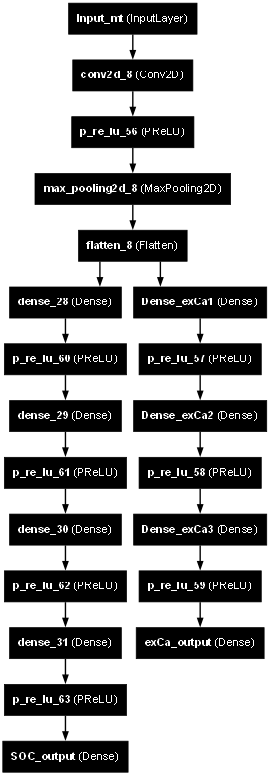

In [81]:
import keras

keras.utils.plot_model(CNN2D_mt, "cnn2d_mt.png", show_shapes=False, show_layer_names=True, dpi=50, rankdir="TB")  # TB ou rankidir="LR"


In [60]:
# preparando os dados de calibração e validação atraves de dicionários
Ycal_dict = {
      'SOC_output': Ycal['SOC'],
      'exCa_output': Ycal['exCa']
}

Yval_dict = {
      'SOC_output': Yval['SOC'],
      'exCa_output': Yval['exCa']
}

In [86]:
# compilando o modelo
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred))) # gerando a função de erro RMSE

CNN2D_mt.compile(optimizer='Adam',
             loss={
                   'SOC_output': rmse,
                   'exCa_output': rmse},
             metrics={
                 'SOC_output': ['r2_score'],
                 'exCa_output': ['r2_score']})

from tensorflow.keras.callbacks import EarlyStopping
# early stopping para o modelo multi-target

early_stopping = EarlyStopping(
    monitor='val_loss',    # prefixo "val_" para validação, caso contrario ele atua no treino (val_r2_score para o r2_score da validação por exemplo)
    mode='min',                # queremos minimizar o erro de validação
    patience=20,             # número de épocas sem melhoria antes de parar o treinamento
    restore_best_weights=True,
    verbose=1)                  # para ver quando o callback aciona

historico_cnn1d_mt = CNN2D_mt.fit(espectrograma_cal,
                    Ycal_dict,
                    epochs=40,
                    batch_size=20, # o batch_size é o numero de amostras que serão incorporadas no erro medio para atualizar os pesos do modelo. se = 10, a cada 10 amostras o modelo atualiza os pesos
                    callbacks=[early_stopping], # aplica o early stopping
                    validation_data=(espectrograma_val, Yval_dict),
                    verbose=1)


Epoch 1/40
33/33 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - SOC_output_loss: 14.3184 - SOC_output_r2_score: -11.7959 - exCa_output_loss: 13.5195 - exCa_output_r2_score: -100.3799 - loss: 129.3546 - val_SOC_output_loss: 6.8427 - val_SOC_output_r2_score: -1.5927 - val_exCa_output_loss: 2.6087 - val_exCa_output_r2_score: -0.9247 - val_loss: 94.7052
Epoch 2/40
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - SOC_output_loss: 5.6192 - SOC_output_r2_score: -0.0863 - exCa_output_loss: 2.1524 - exCa_output_r2_score: -0.3420 - loss: 88.1469 - val_SOC_output_loss: 6.0905 - val_SOC_output_r2_score: -1.0580 - val_exCa_output_loss: 2.1835 - val_exCa_output_r2_score: -0.3514 - val_loss: 74.9365
Epoch 3/40
33/33 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - SOC_output_loss: 5.2284 - SOC_output_r2_score: 0.0639 - exCa_output_loss: 1.8604 - exCa_output_r2_score: 0.0112 - loss: 69.7064 - val_SOC_output_loss: 6.3451 - val_SOC_output_r2_score: -1.2283 - val_exCa_output_loss: 1.7369 - val_exCa_output_r2_score: 0.1422 - val_los

In [76]:
# função para calcular as métricas de desempenho dos modelos multi-target

def resumo_multitarget(df: pd.DataFrame):
    import numpy as np
    import pandas as pd
    from scipy.stats import iqr
    from sklearn.metrics import mean_squared_error, r2_score
    """
    Calcula métricas de desempenho para pares de colunas de um DataFrame.

    - Suporta qualquer DataFrame cujas colunas estejam organizadas em pares:
      [ref1, pred1, ref2, pred2, ..., refN, predN].
    - Retorna um dict com as chaves: 'R2', 'r2', 'RMSE', 'RPIQ', 'Bias', 't_bias'.
      Cada uma delas mapeia o nome da coluna de predição ao valor da métrica.
    """
    cols = df.columns.tolist()
    n_cols = len(cols)
    if n_cols % 2 != 0:
        raise ValueError("DataFrame deve ter número par de colunas (ref × pred).")

    metrics = {
        'R2':   {},
        'r2':   {},
        'RMSE': {},
        'RPIQ': {},
        'Bias': {},
        't_bias': {}
    }

    n = df.shape[0]
    for i in range(0, n_cols, 2):
        ref = cols[i]
        pred = cols[i+1]
        y_ref = df[ref].values
        y_pred = df[pred].values

        # 1) Coeficiente de determinação (sklearn)
        metrics['R2'][pred] = r2_score(y_ref, y_pred)
        # 2) r² via correlação de Pearson
        corr = np.corrcoef(y_ref, y_pred)[0,1]
        metrics['r2'][pred] = corr**2
        # 3) RMSE
        rmse = np.sqrt(mean_squared_error(y_ref, y_pred))
        metrics['RMSE'][pred] = rmse
        # 4) RPIQ = IQR(y_ref) / RMSE
        iqr_val = iqr(y_ref, rng=(25,75))
        metrics['RPIQ'][pred] = iqr_val / rmse if rmse != 0 else np.nan
        # 5) Bias
        bias = np.mean(y_ref - y_pred)
        metrics['Bias'][pred] = bias
        # 6) t-bias: |bias| * sqrt(n) / SDV, SDV = std dos erros (ddof=1)
        errors = y_ref - y_pred
        sdv = np.std(errors - bias, ddof=1)
        metrics['t_bias'][pred] = (abs(bias) * np.sqrt(n) / sdv) if sdv != 0 else np.nan

    return metrics


In [68]:
Ycal=Ycal[['SOC', 'exCa']] # seleciona apenas as colunas SOC e exCa
Yval=Yval[['SOC', 'exCa']]

In [87]:
# transformando os resultados em dataframes
calres_cnn2d_mt = pd.DataFrame({
	'SOC': CNN2D_mt.predict(espectrograma_cal)[0].flatten(), # predição dos dados de calibração,
	'exCa': CNN2D_mt.predict(espectrograma_cal)[1].flatten() # predição dos dados de calibração
})
predres_cnn2d_mt = pd.DataFrame({
	'SOC': CNN2D_mt.predict(espectrograma_val)[0].flatten(), # predição dos dados de validação
	'exCa': CNN2D_mt.predict(espectrograma_val)[1].flatten() # predição dos dados de validação
})

# inserindo os dados de referência nos dataframes
# A função enumerate() em Python é usada para percorrer uma sequência (como uma lista, tupla, string, etc.) e, ao mesmo tempo, obter tanto o índice como o valor de cada elemento.
# Nesse caso ela extrai o índice e o nome da coluna do dataframe Ycal e Yval simultaneamente

for i, col in enumerate(Ycal.columns):
	calres_cnn2d_mt.insert(i * 2, f"Ref_{col}", Ycal[col])

for i, col in enumerate(Yval.columns):
    predres_cnn2d_mt.insert(i * 2, f"Ref_{col}", Yval[col])

21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


In [88]:
# extraindo as métricas de desempenho do modelo multi-target
resumo_cnn2d_mt = {'Cal': pd.DataFrame(resumo_multitarget(calres_cnn2d_mt)),
                 'Pred': pd.DataFrame(resumo_multitarget(predres_cnn2d_mt))}

#printando as metricas
print("R2 Calibração:")
for key, value in resumo_cnn2d_mt['Cal']['R2'].items():
    print(f"{key}: {value}")

print("\nR2 Predição:")
for key, value in resumo_cnn2d_mt['Pred']['R2'].items():
    print(f"{key}: {value}")

print("\nRMSEC:")
for key, value in resumo_cnn2d_mt['Cal']['RMSE'].items():
    print(f"{key}: {value}")

print("\nRMSEP:")
for key, value in resumo_cnn2d_mt['Pred']['RMSE'].items():
    print(f"{key}: {value}")

print("\nRPIQ:")
for key, value in resumo_cnn2d_mt['Pred']['RPIQ'].items():
    print(f"{key}: {value}")

R2 Calibração:
SOC: 0.7178355743507016
exCa: 0.8864615448310622

R2 Predição:
SOC: 0.25555647155863503
exCa: 0.8055655150232282

RMSEC:
SOC: 2.8706710976117966
exCa: 0.6443539001068129

RMSEP:
SOC: 3.696443701536879
exCa: 0.8328859263324958

RPIQ:
SOC: 1.7503309998499237
exCa: 3.661966067106303
